# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [2]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [7]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [8]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [13]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [14]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [17]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim, device=device)
    #### END CODE HERE ####

In [18]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](relu-graph.png)  |  ![](lrelu-graph.png)





In [24]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2, inplace=True)
        #### END CODE HERE ####
    )

In [25]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [28]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim,1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [29]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Make sure there's no sigmoid
    assert test_input.max() > 1
    assert test_input.min() < -1

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [30]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [31]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [32]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     Note: Please do not use concatenation in your solution. The tests are being updated to 
    #           support this, but for now, average the two losses as described in step (4).
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    noise = get_noise(num_images, z_dim, device=device)
    fake = gen(noise)
    fake_pred = disc(fake.detach())
    fake_loss = criterion(fake_pred, torch.zeros_like(fake_pred))
    real_pred = disc(real)
    real_loss = criterion(real_pred, torch.ones_like(real_pred))
    disc_loss = (fake_loss + real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [33]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [34]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

In [35]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](MNIST_Progression.png)

Epoch 1, step 500: Generator loss: 1.3454920221567155, discriminator loss: 0.42776623135805175


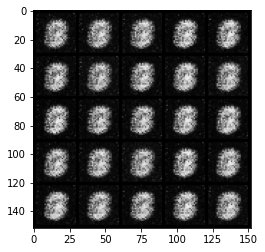

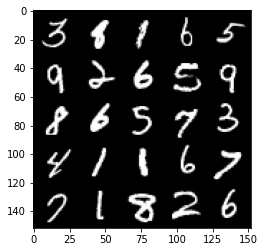

Epoch 2, step 1000: Generator loss: 1.7444786949157722, discriminator loss: 0.2824568791389465


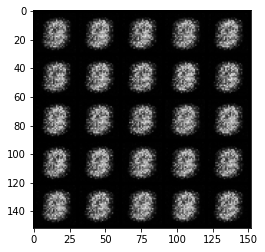

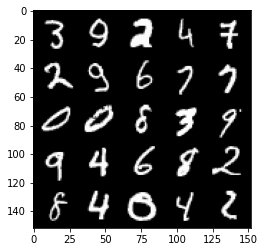

Epoch 3, step 1500: Generator loss: 2.008349338054659, discriminator loss: 0.16703210246562986


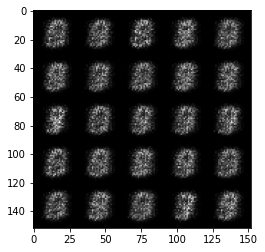

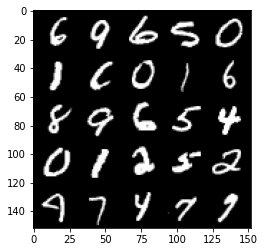

Epoch 4, step 2000: Generator loss: 1.7135176134109482, discriminator loss: 0.2146343930065631


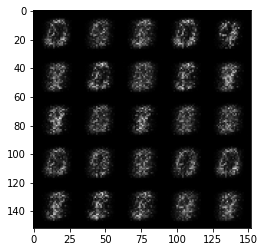

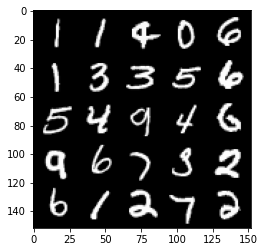

Epoch 5, step 2500: Generator loss: 1.6771445794105528, discriminator loss: 0.20865737181901925


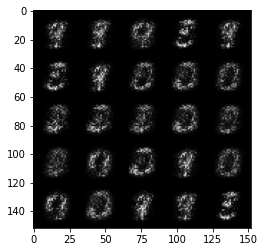

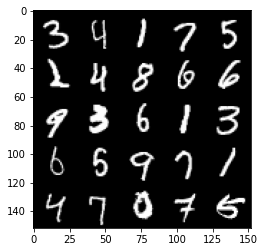

Epoch 6, step 3000: Generator loss: 2.013756895303726, discriminator loss: 0.15795738227665415


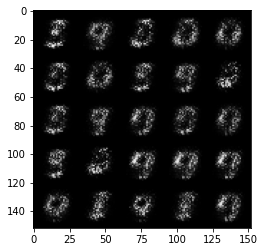

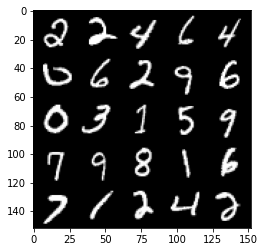

Epoch 7, step 3500: Generator loss: 2.4435014648437496, discriminator loss: 0.11564650355279443


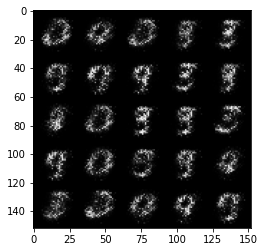

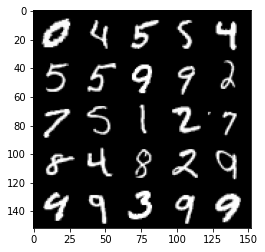

Epoch 8, step 4000: Generator loss: 2.9322362895011906, discriminator loss: 0.08846695506572723


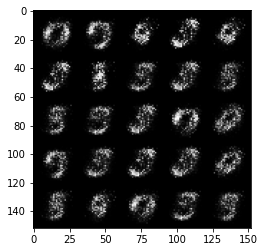

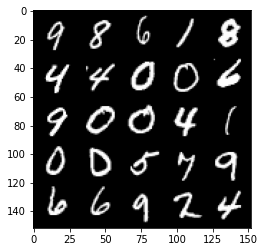

Epoch 9, step 4500: Generator loss: 3.135665813922881, discriminator loss: 0.09526111464947463


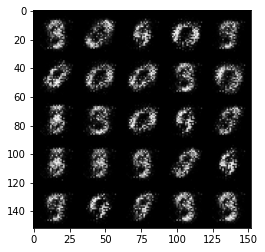

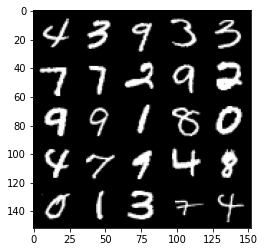

Epoch 10, step 5000: Generator loss: 3.412365277290345, discriminator loss: 0.08355939848721021


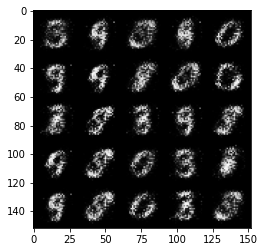

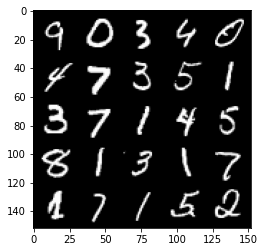

Epoch 11, step 5500: Generator loss: 3.6338957929611206, discriminator loss: 0.07763394909352066


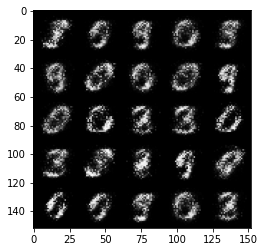

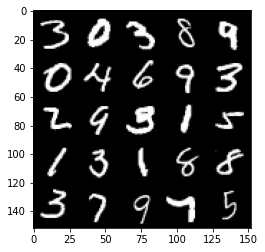

Epoch 12, step 6000: Generator loss: 3.6419875993728614, discriminator loss: 0.0791912937834859


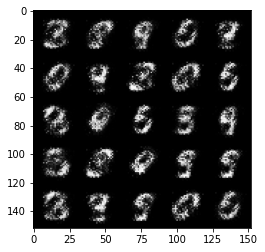

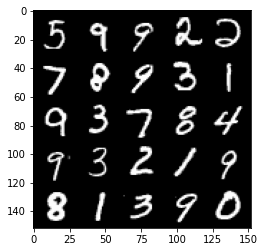

Epoch 13, step 6500: Generator loss: 3.8905856471061693, discriminator loss: 0.0665101423338056


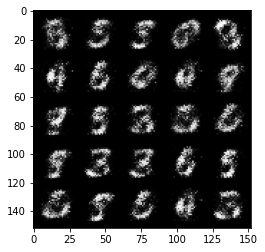

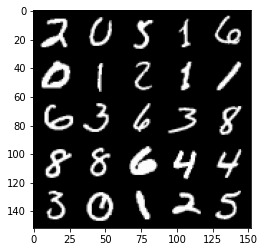

Epoch 14, step 7000: Generator loss: 4.006476200103763, discriminator loss: 0.05103901674225926


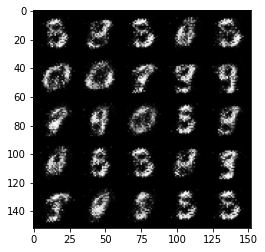

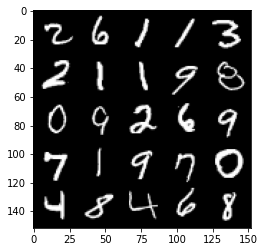

Epoch 15, step 7500: Generator loss: 4.0434101037979175, discriminator loss: 0.051630987994372844


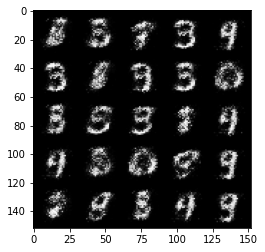

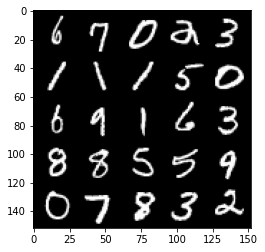

Epoch 17, step 8000: Generator loss: 4.1124198446273805, discriminator loss: 0.04958490392938259


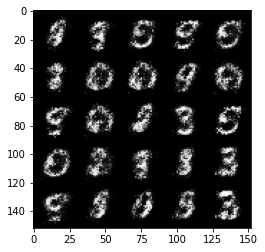

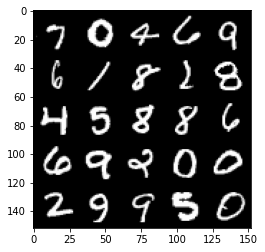

Epoch 18, step 8500: Generator loss: 3.882736159801481, discriminator loss: 0.06262052782624958


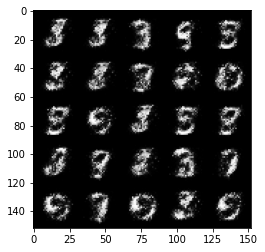

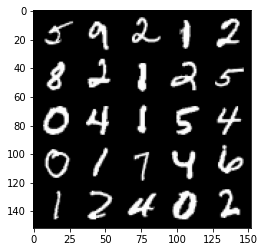

Epoch 19, step 9000: Generator loss: 3.9417186360359215, discriminator loss: 0.06597771287709472


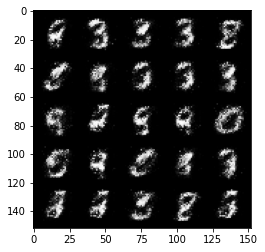

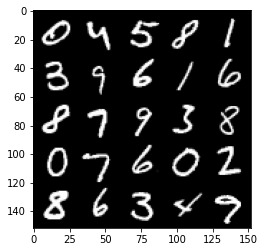

Epoch 20, step 9500: Generator loss: 3.9286584596633887, discriminator loss: 0.064380628041923


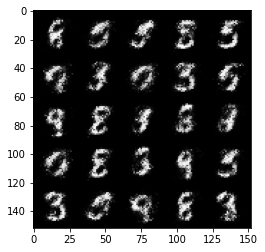

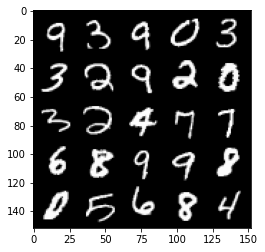

Epoch 21, step 10000: Generator loss: 3.7951909642219546, discriminator loss: 0.0720829069763422


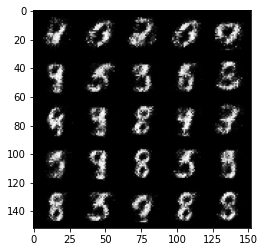

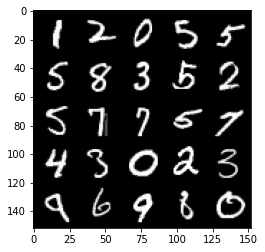

Epoch 22, step 10500: Generator loss: 3.9004372119903548, discriminator loss: 0.0804831875041128


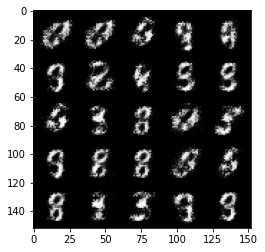

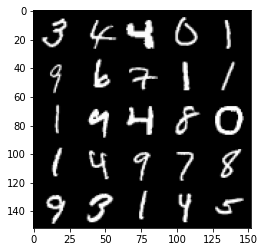

Epoch 23, step 11000: Generator loss: 4.018804585456849, discriminator loss: 0.08696200575679543


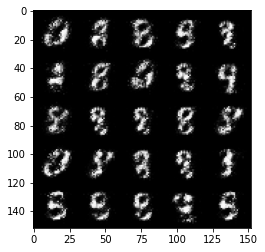

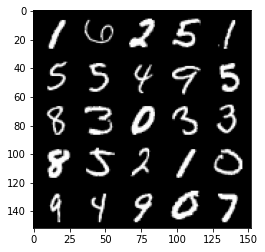

Epoch 24, step 11500: Generator loss: 4.0443142576217666, discriminator loss: 0.07331700686365358


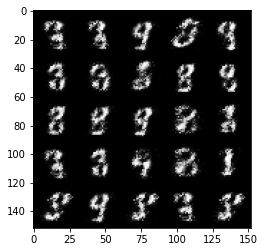

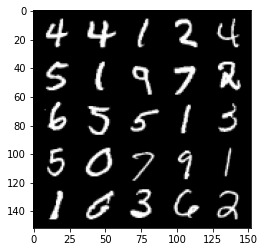

Epoch 25, step 12000: Generator loss: 3.8181140079498292, discriminator loss: 0.08855197613686328


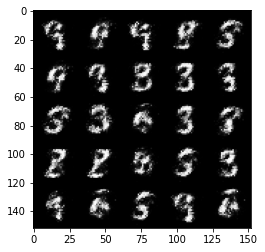

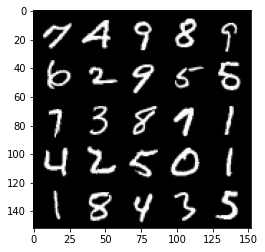

Epoch 26, step 12500: Generator loss: 3.7276654019355764, discriminator loss: 0.08767965370416633


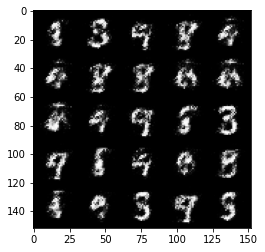

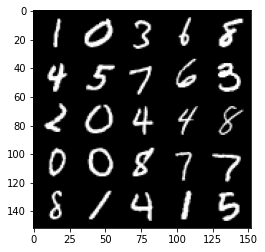

Epoch 27, step 13000: Generator loss: 3.6031941714286795, discriminator loss: 0.08868447145819673


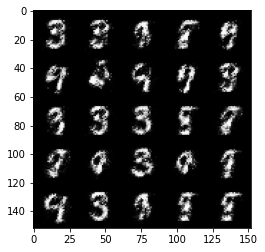

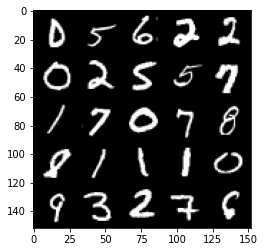

Epoch 28, step 13500: Generator loss: 3.8909451351165782, discriminator loss: 0.0793408899083733


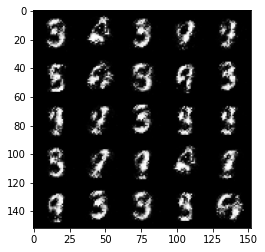

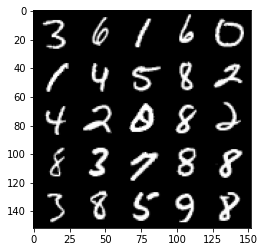

Epoch 29, step 14000: Generator loss: 3.7891357326507555, discriminator loss: 0.0892944408282638


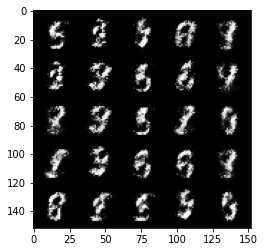

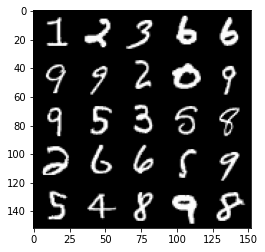

Epoch 30, step 14500: Generator loss: 3.6722804832458493, discriminator loss: 0.10595716265589002


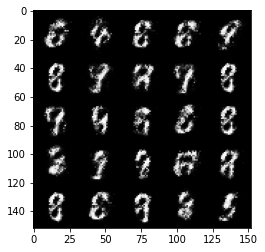

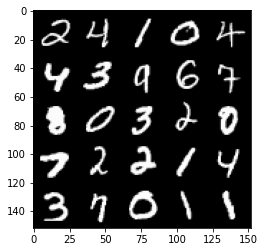

Epoch 31, step 15000: Generator loss: 3.6812922124862664, discriminator loss: 0.10702883760631085


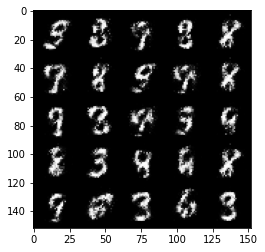

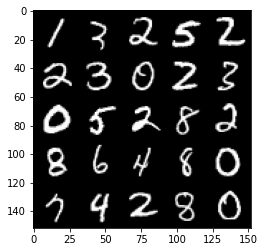

Epoch 33, step 15500: Generator loss: 3.649840059280399, discriminator loss: 0.11116240718215704


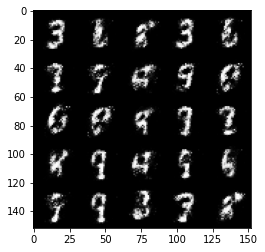

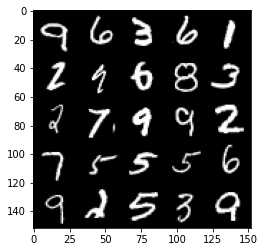

Epoch 34, step 16000: Generator loss: 3.5136230616569555, discriminator loss: 0.11288463543355463


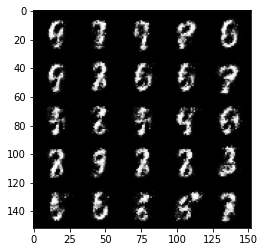

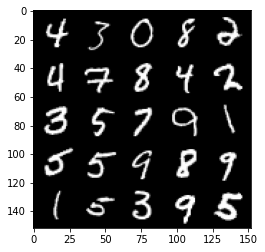

Epoch 35, step 16500: Generator loss: 3.6569703178405786, discriminator loss: 0.11697035369276983


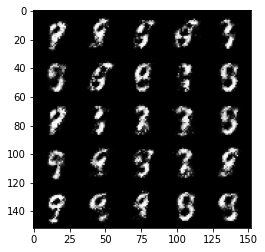

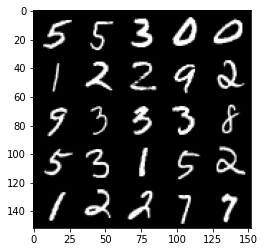

Epoch 36, step 17000: Generator loss: 3.547459284782408, discriminator loss: 0.12707841072976586


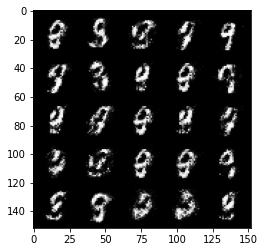

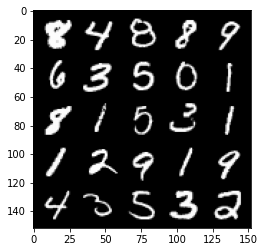

Epoch 37, step 17500: Generator loss: 3.5036697754859962, discriminator loss: 0.14149666720628754


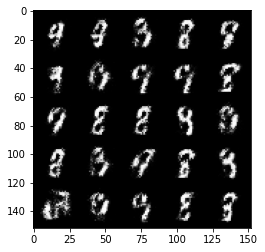

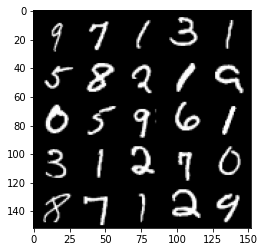

Epoch 38, step 18000: Generator loss: 3.5494824738502486, discriminator loss: 0.12441883434355251


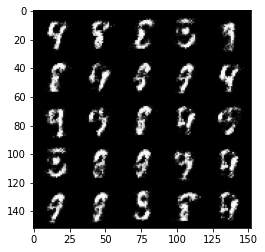

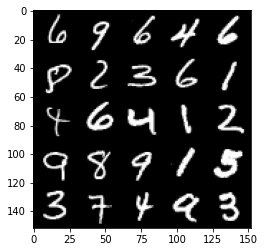

Epoch 39, step 18500: Generator loss: 3.525693563938142, discriminator loss: 0.13184027211368085


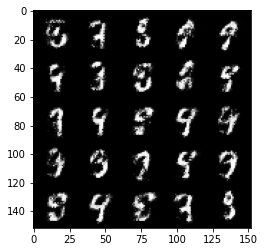

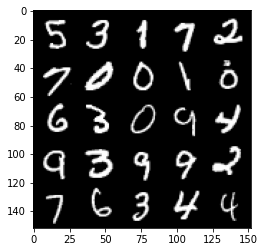

Epoch 40, step 19000: Generator loss: 3.393672553062438, discriminator loss: 0.13746798770129678


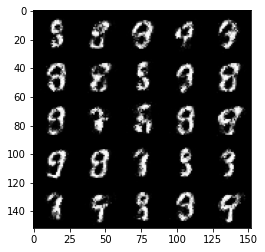

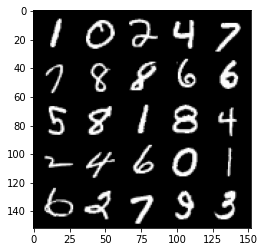

Epoch 41, step 19500: Generator loss: 3.3222323021888704, discriminator loss: 0.13660581625998022


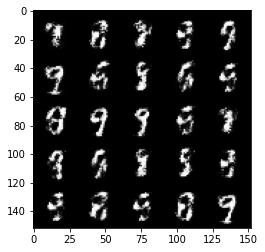

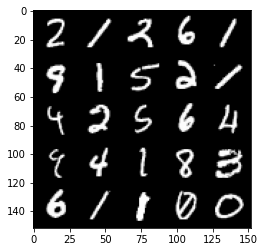

Epoch 42, step 20000: Generator loss: 3.2636829738616964, discriminator loss: 0.15786072582006452


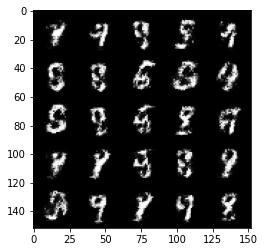

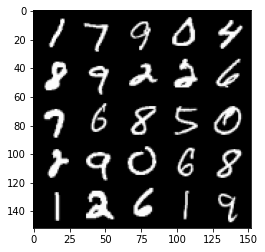

Epoch 43, step 20500: Generator loss: 3.379341890335082, discriminator loss: 0.14325911420583717


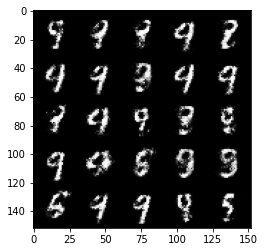

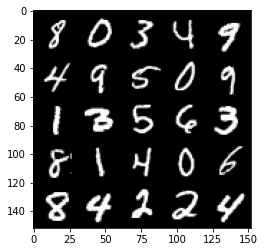

Epoch 44, step 21000: Generator loss: 3.09718196296692, discriminator loss: 0.18060248270630838


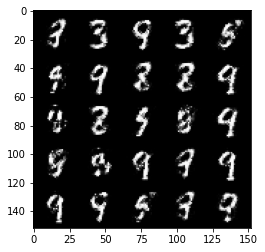

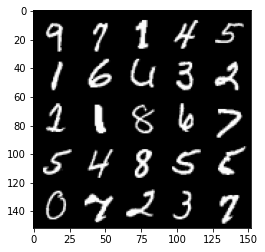

Epoch 45, step 21500: Generator loss: 3.203791516780848, discriminator loss: 0.1454479761198162


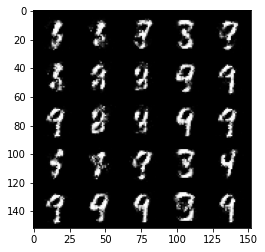

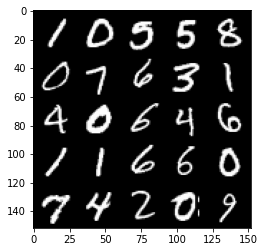

Epoch 46, step 22000: Generator loss: 3.3481500043869024, discriminator loss: 0.14823651155829423


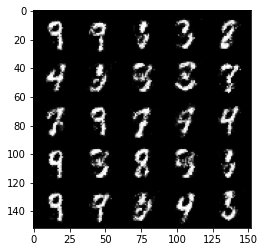

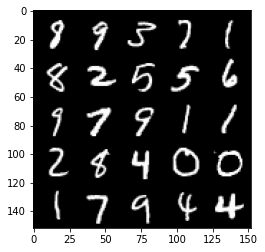

Epoch 47, step 22500: Generator loss: 3.232423334121706, discriminator loss: 0.18074959431588658


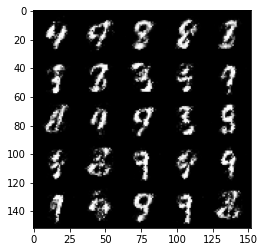

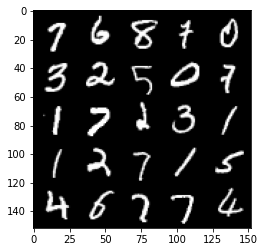

Epoch 49, step 23000: Generator loss: 2.96826878786087, discriminator loss: 0.18105393171310394


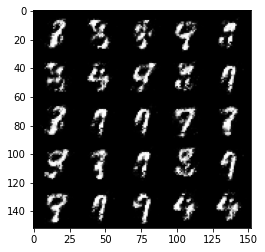

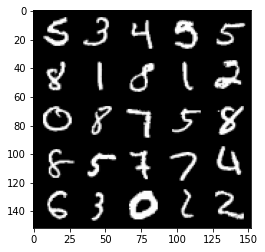

Epoch 50, step 23500: Generator loss: 3.071189682960513, discriminator loss: 0.17695415629446515


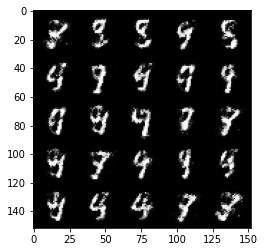

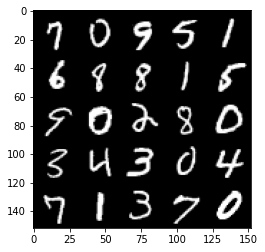

Epoch 51, step 24000: Generator loss: 2.8775580091476427, discriminator loss: 0.20256105300784116


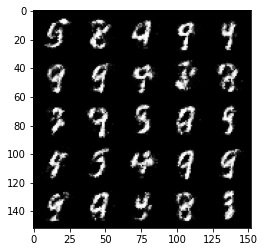

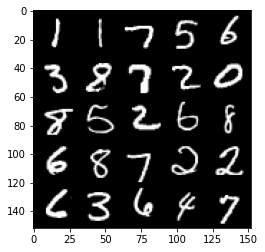

Epoch 52, step 24500: Generator loss: 2.846615316390992, discriminator loss: 0.20265730266273038


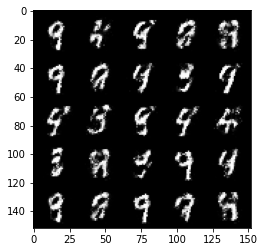

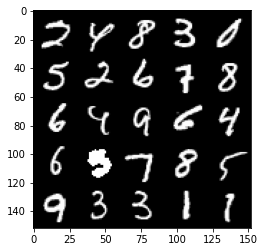

Epoch 53, step 25000: Generator loss: 2.887266538619997, discriminator loss: 0.2043503327518702


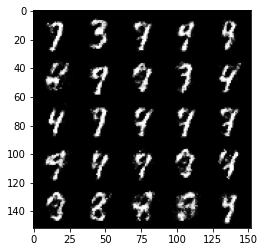

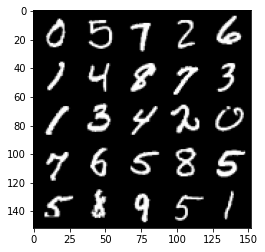

Epoch 54, step 25500: Generator loss: 2.8436376676559454, discriminator loss: 0.21498947183787803


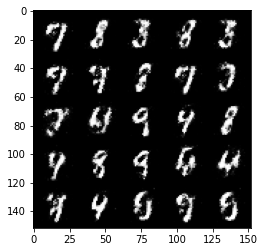

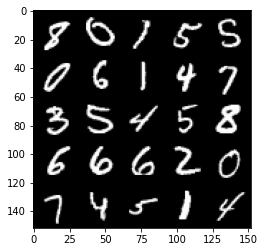

Epoch 55, step 26000: Generator loss: 2.8144518117904647, discriminator loss: 0.22471885235607644


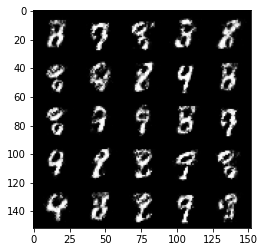

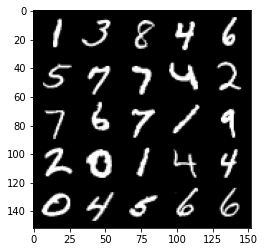

Epoch 56, step 26500: Generator loss: 2.586549768924717, discriminator loss: 0.23981409311294552


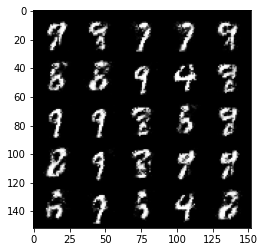

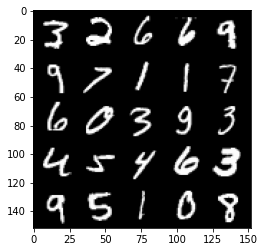

Epoch 57, step 27000: Generator loss: 2.6687566161155694, discriminator loss: 0.2181004080474375


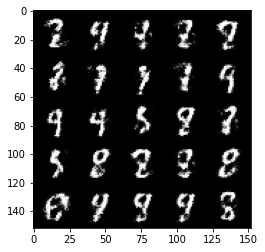

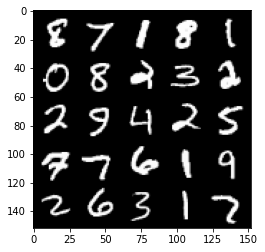

Epoch 58, step 27500: Generator loss: 2.6439585642814603, discriminator loss: 0.2249073716998099


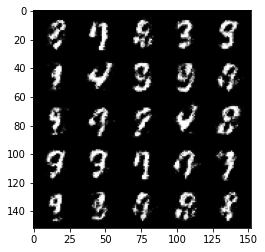

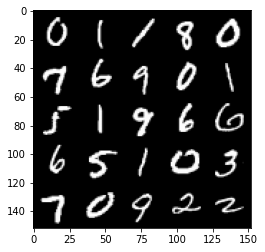

Epoch 59, step 28000: Generator loss: 2.6302703003883394, discriminator loss: 0.22780409264564513


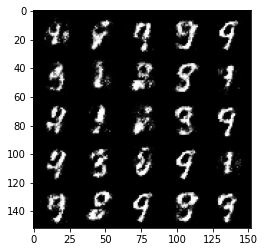

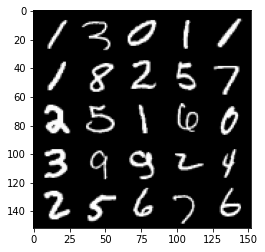

Epoch 60, step 28500: Generator loss: 2.4990030333995814, discriminator loss: 0.24438195323944084


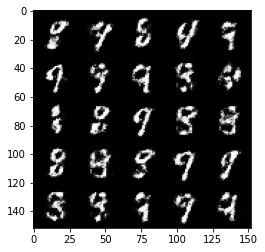

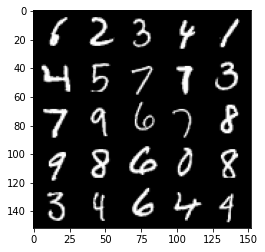

Epoch 61, step 29000: Generator loss: 2.5488085374832172, discriminator loss: 0.2323440591990947


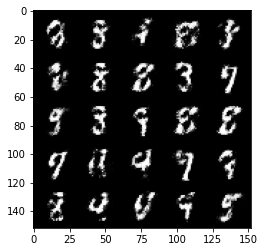

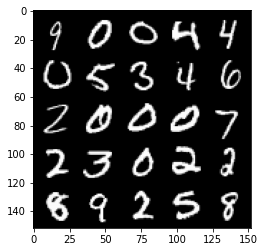

Epoch 62, step 29500: Generator loss: 2.6506079287528963, discriminator loss: 0.2279094385355708


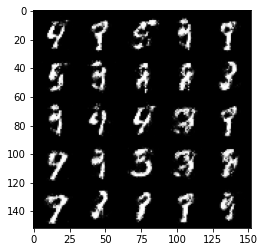

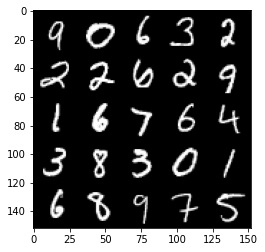

Epoch 63, step 30000: Generator loss: 2.6508799242973335, discriminator loss: 0.22900347697734838


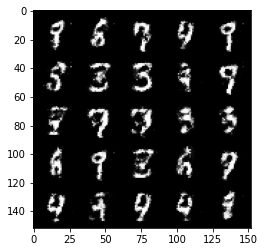

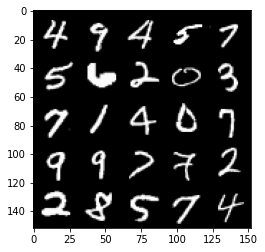

Epoch 65, step 30500: Generator loss: 2.4817467653751373, discriminator loss: 0.25837717354297646


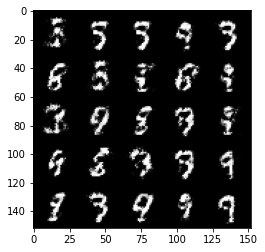

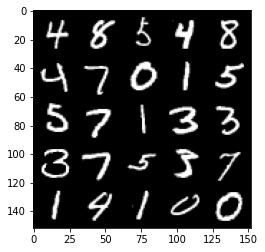

Epoch 66, step 31000: Generator loss: 2.509172303915023, discriminator loss: 0.241277833789587


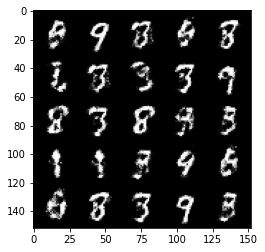

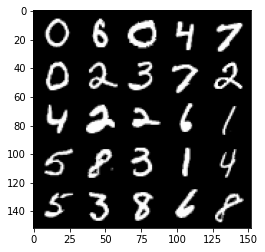

Epoch 67, step 31500: Generator loss: 2.38249607872963, discriminator loss: 0.28414084190130245


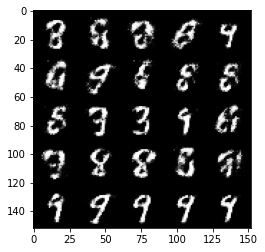

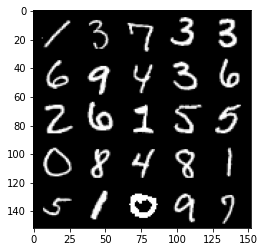

Epoch 68, step 32000: Generator loss: 2.2489215123653454, discriminator loss: 0.30167146968841524


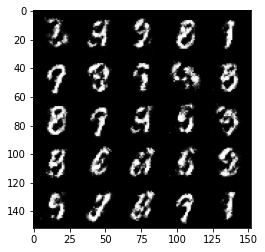

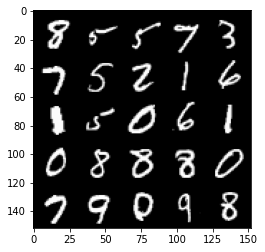

Epoch 69, step 32500: Generator loss: 2.3916350915431974, discriminator loss: 0.271300712049007


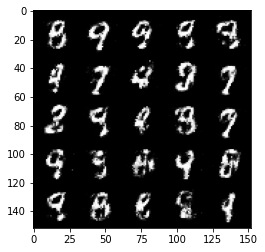

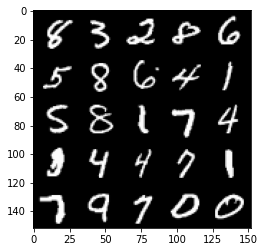

Epoch 70, step 33000: Generator loss: 2.3328453643322002, discriminator loss: 0.2816543499231341


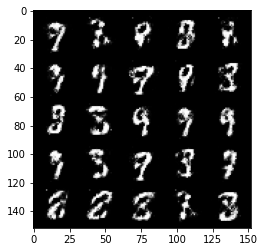

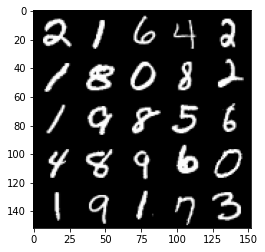

Epoch 71, step 33500: Generator loss: 2.3300386447906503, discriminator loss: 0.2786868949830533


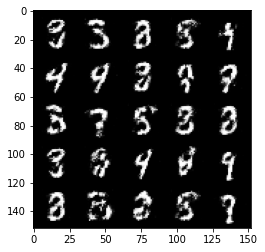

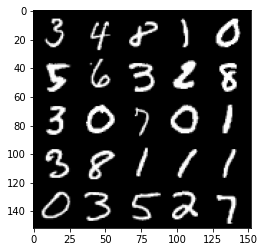

Epoch 72, step 34000: Generator loss: 2.3207684793472287, discriminator loss: 0.28288467729091626


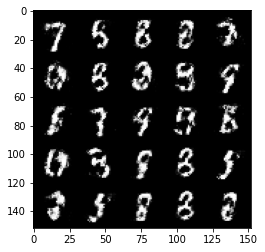

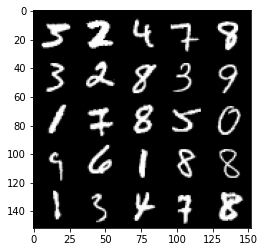

Epoch 73, step 34500: Generator loss: 2.4537833001613603, discriminator loss: 0.24579154035449027


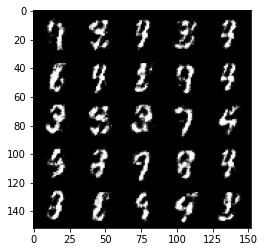

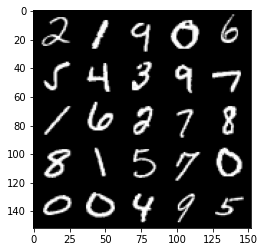

Epoch 74, step 35000: Generator loss: 2.3540189893245693, discriminator loss: 0.2741088636517525


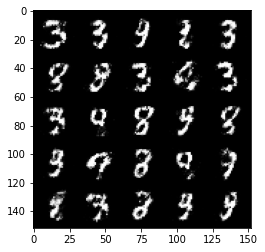

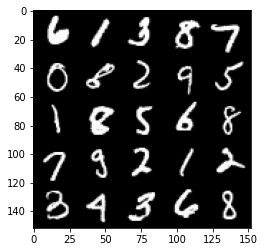

Epoch 75, step 35500: Generator loss: 2.365892974138259, discriminator loss: 0.25454694831371305


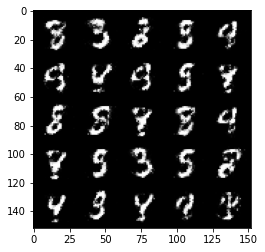

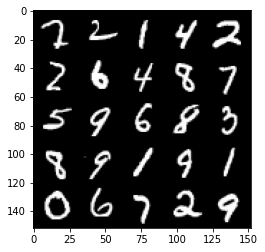

Epoch 76, step 36000: Generator loss: 2.491517934799196, discriminator loss: 0.23342527472972865


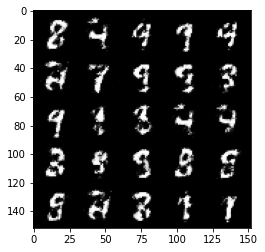

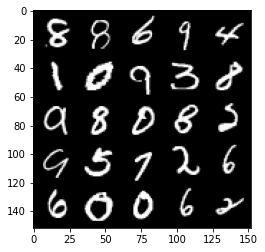

Epoch 77, step 36500: Generator loss: 2.4443063700199117, discriminator loss: 0.24906409609317795


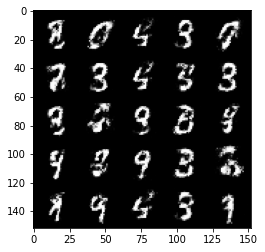

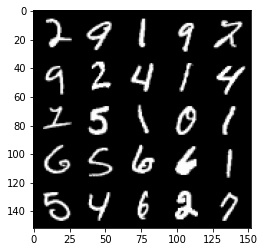

Epoch 78, step 37000: Generator loss: 2.36926382923126, discriminator loss: 0.26284875223040577


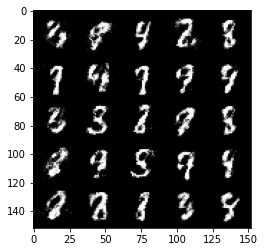

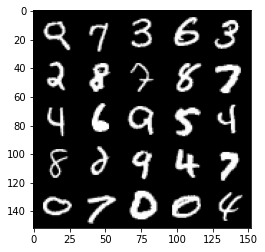

Epoch 79, step 37500: Generator loss: 2.2924195048809057, discriminator loss: 0.2790436433255672


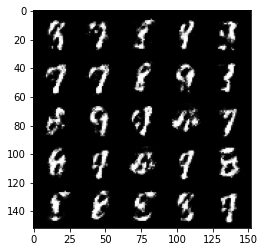

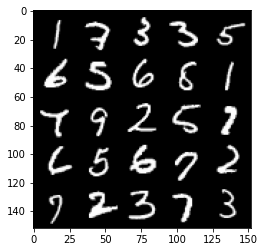

Epoch 81, step 38000: Generator loss: 2.3909476149082187, discriminator loss: 0.25042770463228237


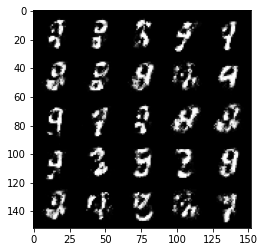

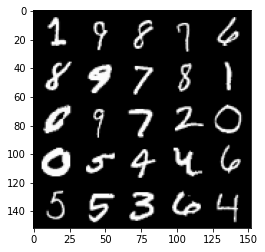

Epoch 82, step 38500: Generator loss: 2.452707714319229, discriminator loss: 0.24575119131803513


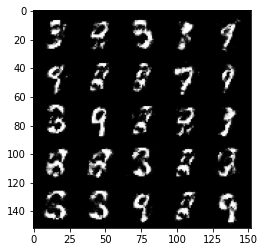

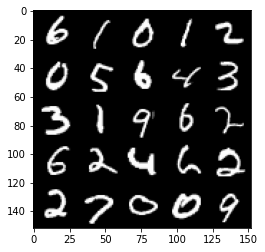

Epoch 83, step 39000: Generator loss: 2.268911716222764, discriminator loss: 0.2926062144637108


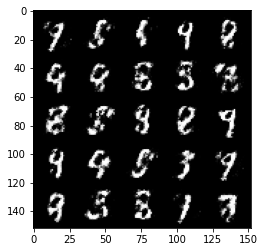

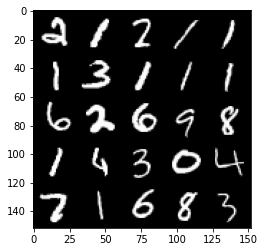

Epoch 84, step 39500: Generator loss: 2.1655844676494618, discriminator loss: 0.3033049952089787


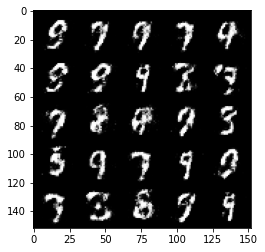

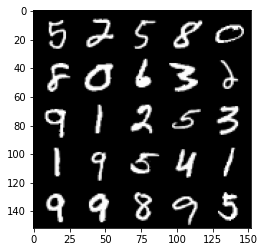

Epoch 85, step 40000: Generator loss: 2.1782171463966367, discriminator loss: 0.28510931429266917


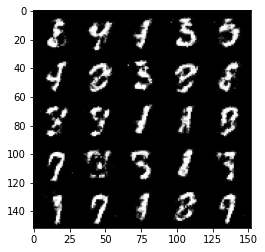

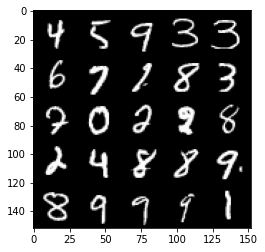

Epoch 86, step 40500: Generator loss: 2.131563425064086, discriminator loss: 0.3036409301757811


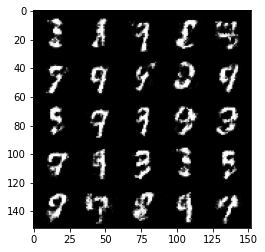

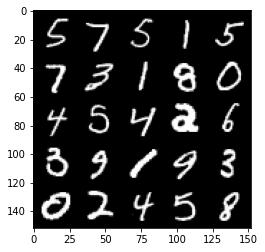

Epoch 87, step 41000: Generator loss: 2.0158410525321946, discriminator loss: 0.32480114591121656


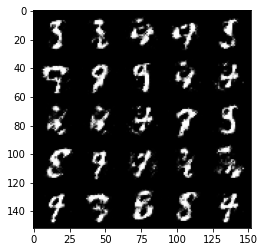

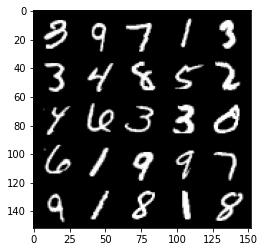

Epoch 88, step 41500: Generator loss: 2.108978937625883, discriminator loss: 0.30900007894635206


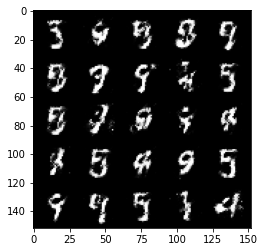

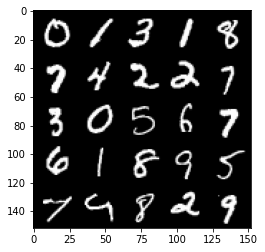

Epoch 89, step 42000: Generator loss: 2.19846888780594, discriminator loss: 0.2855848549306394


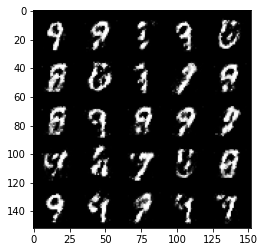

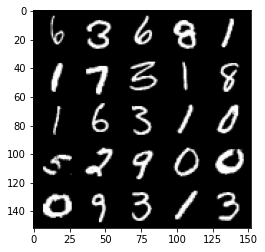

Epoch 90, step 42500: Generator loss: 2.147228797674178, discriminator loss: 0.29405228570103614


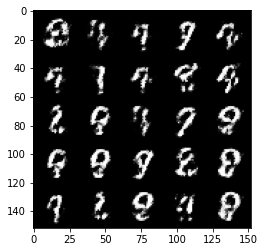

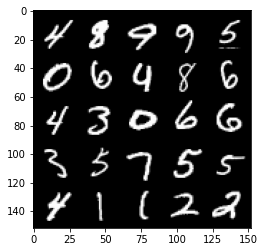

Epoch 91, step 43000: Generator loss: 2.1231350376605977, discriminator loss: 0.31187404531240454


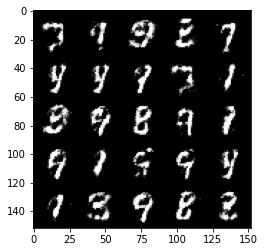

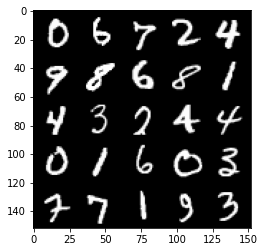

Epoch 92, step 43500: Generator loss: 2.1734896421432492, discriminator loss: 0.30440161827206613


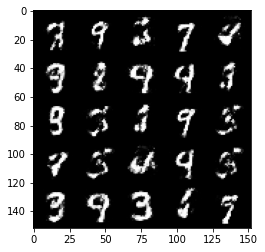

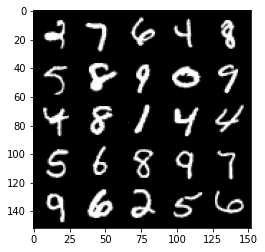

Epoch 93, step 44000: Generator loss: 2.052660449504853, discriminator loss: 0.31876408138871176


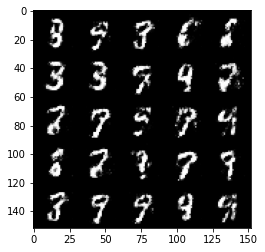

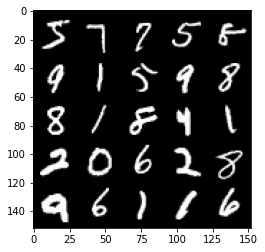

Epoch 94, step 44500: Generator loss: 2.133130844831468, discriminator loss: 0.3031801447272303


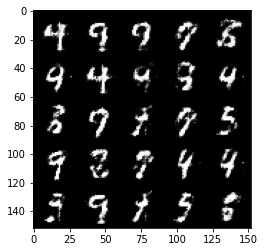

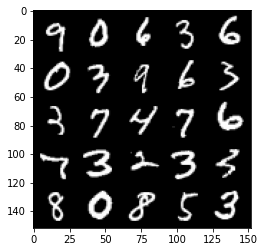

Epoch 95, step 45000: Generator loss: 2.1308925242424017, discriminator loss: 0.3079234127104285


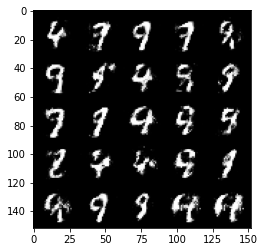

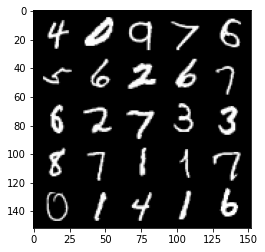

Epoch 97, step 45500: Generator loss: 2.0392979173660266, discriminator loss: 0.3129465768635273


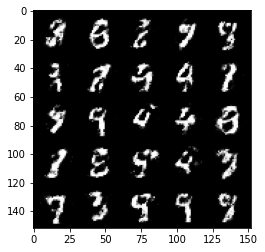

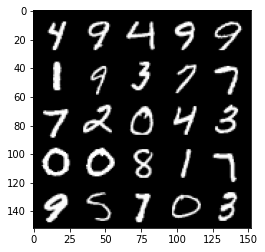

Epoch 98, step 46000: Generator loss: 2.03977670311928, discriminator loss: 0.31041852489113814


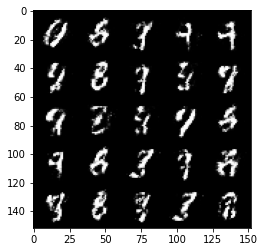

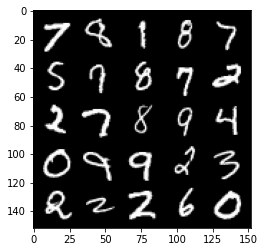

Epoch 99, step 46500: Generator loss: 2.0664873743057277, discriminator loss: 0.31234255492687274


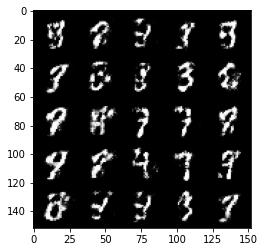

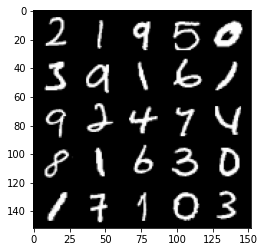

Epoch 100, step 47000: Generator loss: 2.060745404481888, discriminator loss: 0.32410231307148907


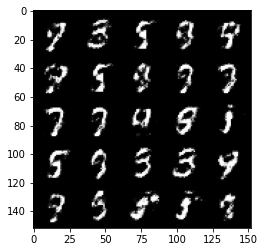

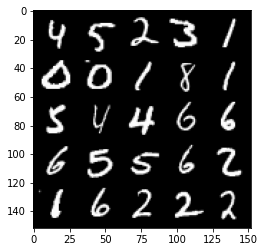

Epoch 101, step 47500: Generator loss: 1.9636536939144156, discriminator loss: 0.3436707521080968


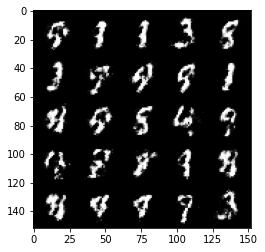

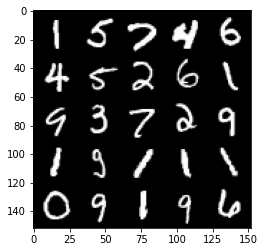

Epoch 102, step 48000: Generator loss: 1.9708130929470065, discriminator loss: 0.3288831091523172


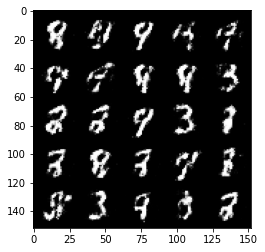

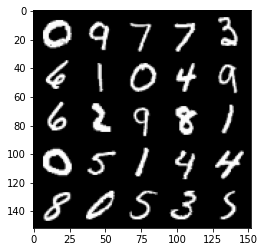

Epoch 103, step 48500: Generator loss: 2.010880998849869, discriminator loss: 0.323659057766199


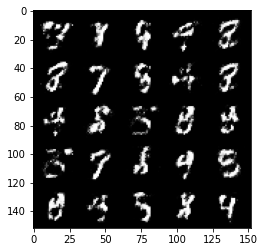

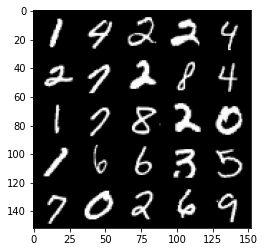

Epoch 104, step 49000: Generator loss: 2.0164222810268395, discriminator loss: 0.3262133011221885


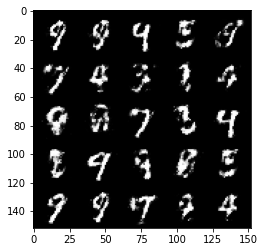

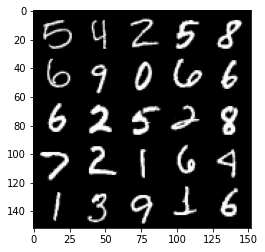

Epoch 105, step 49500: Generator loss: 1.9855028896331794, discriminator loss: 0.33300715267658226


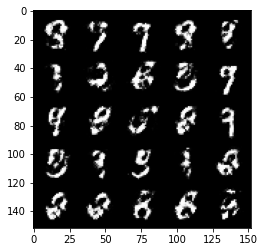

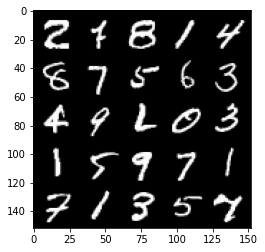

Epoch 106, step 50000: Generator loss: 1.991636888504028, discriminator loss: 0.3273004733324052


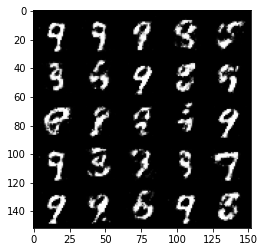

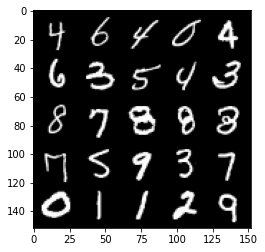

Epoch 107, step 50500: Generator loss: 1.9688084588050838, discriminator loss: 0.3329571850597856


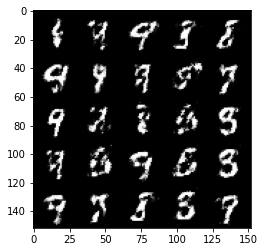

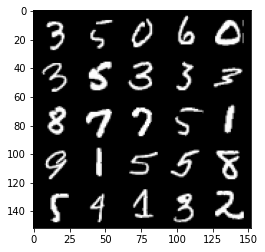

Epoch 108, step 51000: Generator loss: 2.0259266486167906, discriminator loss: 0.3237262777984141


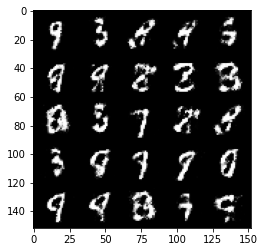

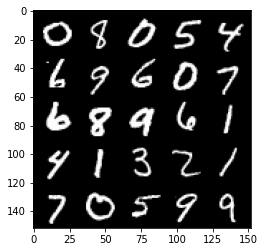

Epoch 109, step 51500: Generator loss: 2.043269681453706, discriminator loss: 0.3301523784697057


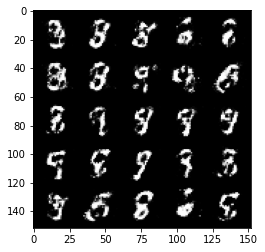

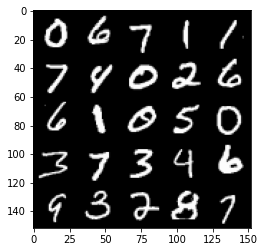

Epoch 110, step 52000: Generator loss: 2.0239929141998276, discriminator loss: 0.31935733002424244


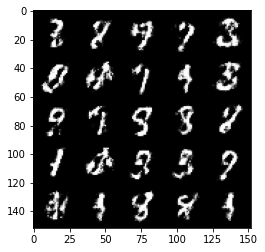

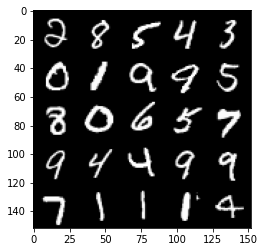

Epoch 111, step 52500: Generator loss: 1.871926661252975, discriminator loss: 0.35884578561782843


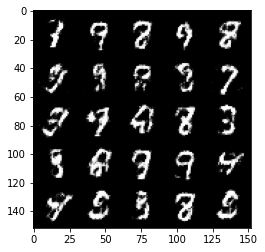

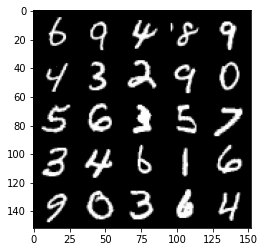

Epoch 113, step 53000: Generator loss: 1.9678703315258017, discriminator loss: 0.3265291171669959


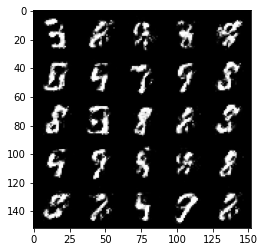

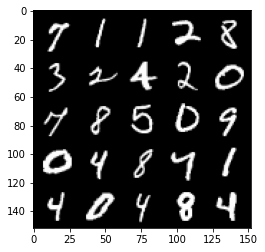

Epoch 114, step 53500: Generator loss: 1.9763751943111452, discriminator loss: 0.3237086711227893


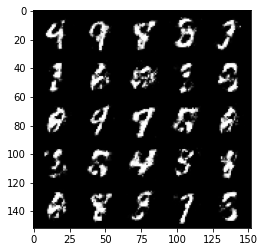

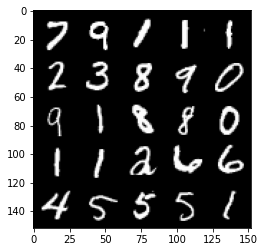

Epoch 115, step 54000: Generator loss: 2.0119639663696303, discriminator loss: 0.31022798380255706


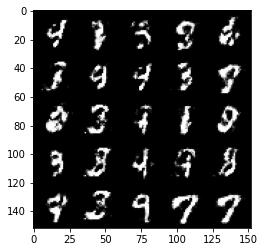

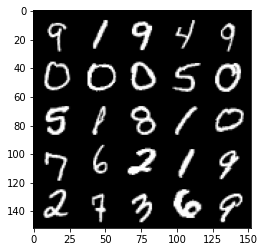

Epoch 116, step 54500: Generator loss: 2.0219378855228425, discriminator loss: 0.31800373929738984


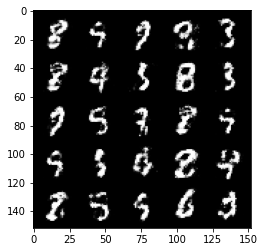

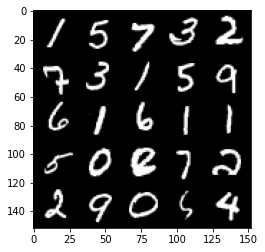

Epoch 117, step 55000: Generator loss: 1.8673378062248212, discriminator loss: 0.34401522803306595


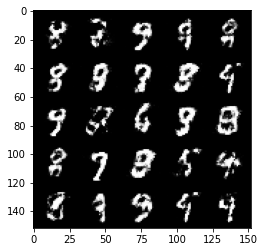

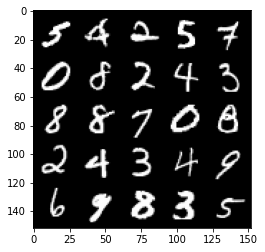

Epoch 118, step 55500: Generator loss: 1.8513114590644832, discriminator loss: 0.34990023812651655


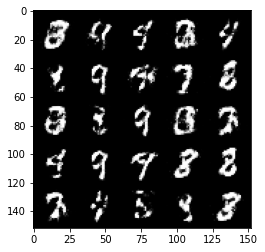

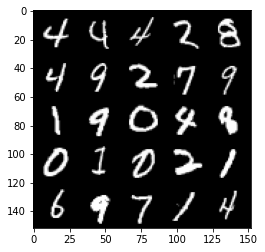

Epoch 119, step 56000: Generator loss: 1.918892527103423, discriminator loss: 0.33084026890993123


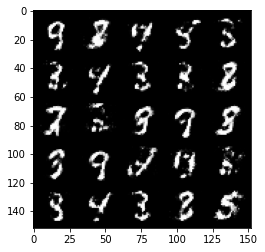

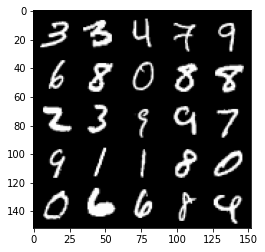

Epoch 120, step 56500: Generator loss: 1.812516199827192, discriminator loss: 0.36669727247953404


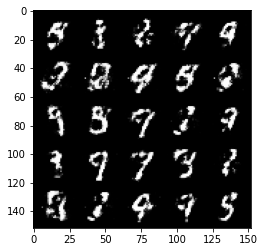

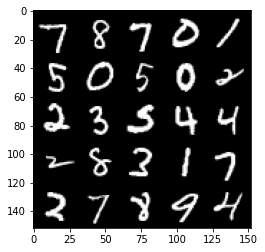

Epoch 121, step 57000: Generator loss: 1.912467544555664, discriminator loss: 0.34204246133565885


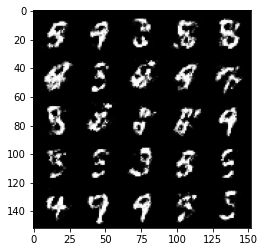

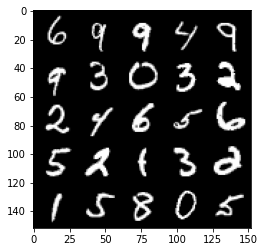

Epoch 122, step 57500: Generator loss: 1.7613495297431947, discriminator loss: 0.3779188013672828


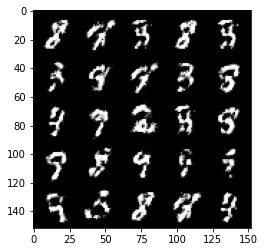

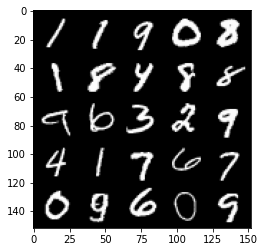

Epoch 123, step 58000: Generator loss: 1.8441275303363802, discriminator loss: 0.3561038147807121


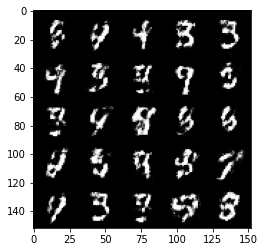

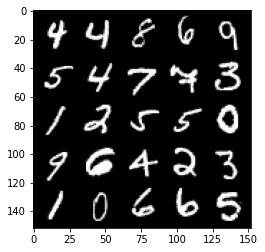

Epoch 124, step 58500: Generator loss: 1.7676353845596346, discriminator loss: 0.3674287728071211


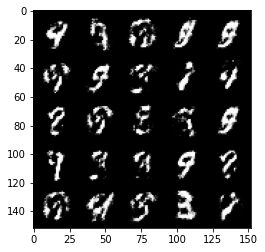

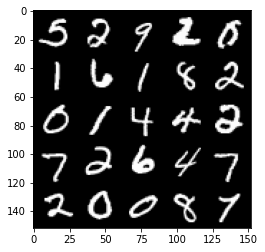

Epoch 125, step 59000: Generator loss: 1.8292077722549438, discriminator loss: 0.347626865029335


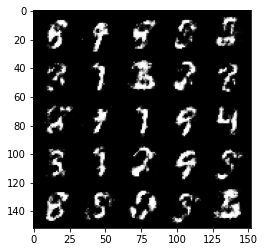

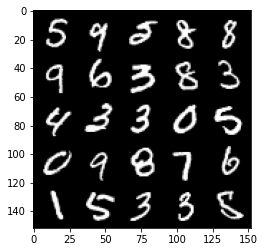

Epoch 126, step 59500: Generator loss: 1.7707822887897489, discriminator loss: 0.36573729419708234


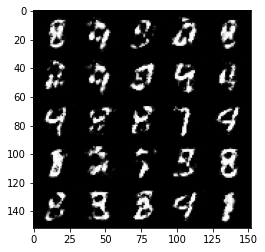

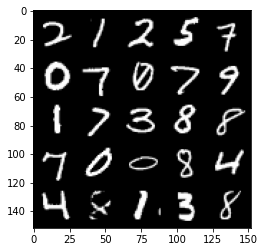

Epoch 127, step 60000: Generator loss: 1.7864472467899328, discriminator loss: 0.3687831235527994


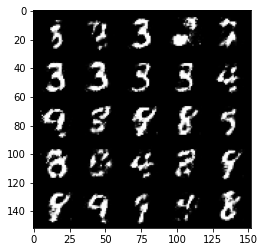

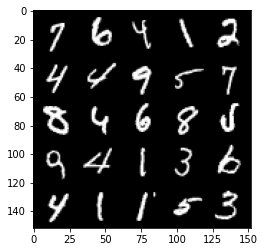

Epoch 128, step 60500: Generator loss: 1.7415809407234164, discriminator loss: 0.3841928797364234


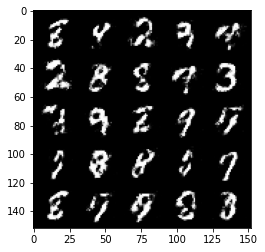

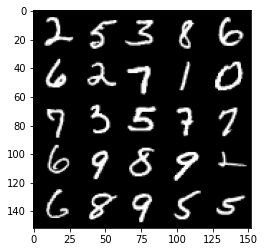

Epoch 130, step 61000: Generator loss: 1.7499174156188986, discriminator loss: 0.3740374954342841


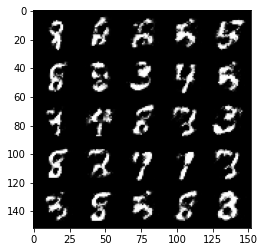

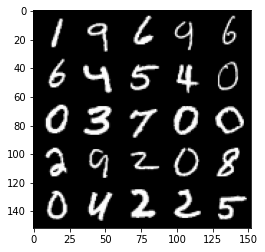

Epoch 131, step 61500: Generator loss: 1.6884359080791476, discriminator loss: 0.41143763983249715


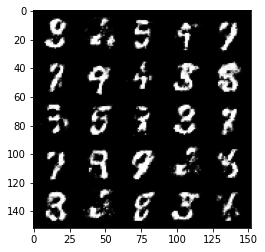

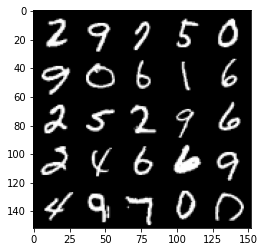

Epoch 132, step 62000: Generator loss: 1.6415798211097699, discriminator loss: 0.39796785676479346


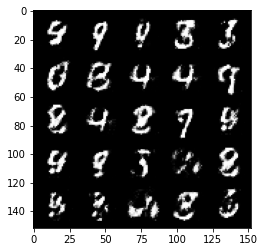

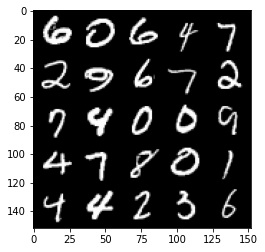

Epoch 133, step 62500: Generator loss: 1.602147181510924, discriminator loss: 0.4207272738218305


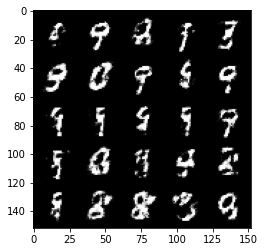

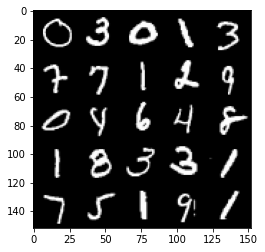

Epoch 134, step 63000: Generator loss: 1.6107706024646762, discriminator loss: 0.41034599584341064


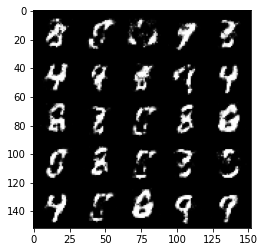

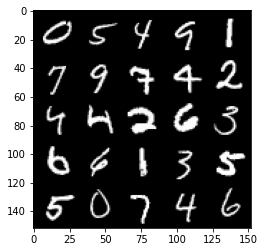

Epoch 135, step 63500: Generator loss: 1.5925854444503784, discriminator loss: 0.40957431638240804


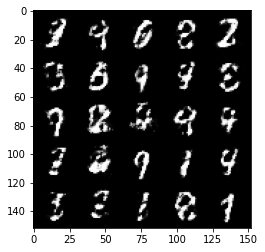

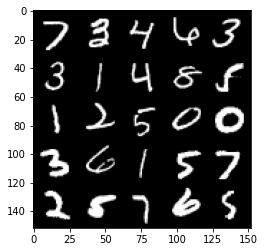

Epoch 136, step 64000: Generator loss: 1.5806793663501744, discriminator loss: 0.41708814322948434


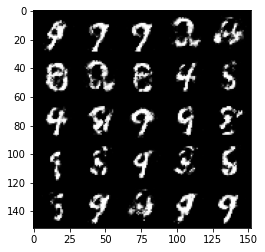

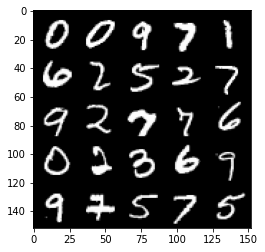

Epoch 137, step 64500: Generator loss: 1.6650066959857948, discriminator loss: 0.38901957076787946


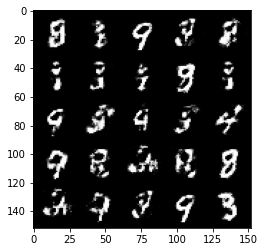

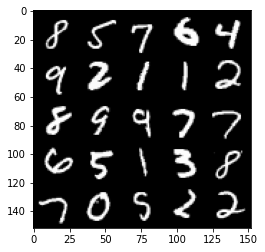

Epoch 138, step 65000: Generator loss: 1.6936291732788087, discriminator loss: 0.3841266109943389


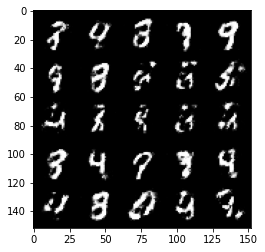

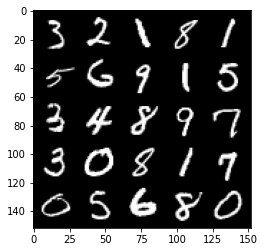

Epoch 139, step 65500: Generator loss: 1.6557543585300465, discriminator loss: 0.3918256950974464


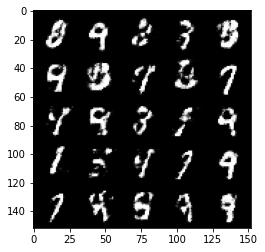

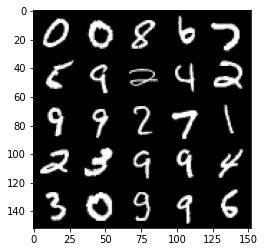

Epoch 140, step 66000: Generator loss: 1.5504054679870616, discriminator loss: 0.41085810822248453


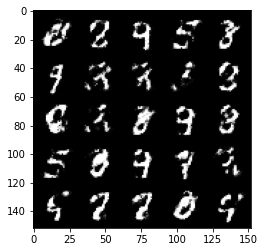

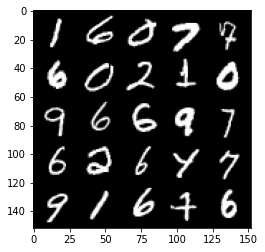

Epoch 141, step 66500: Generator loss: 1.7347482206821423, discriminator loss: 0.3771759242415427


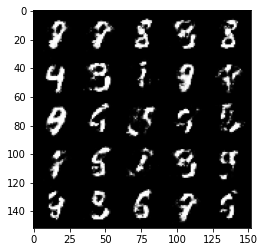

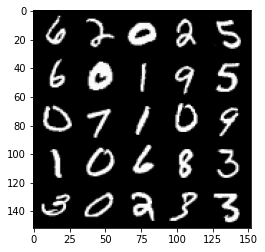

Epoch 142, step 67000: Generator loss: 1.6281903967857352, discriminator loss: 0.3959554327130322


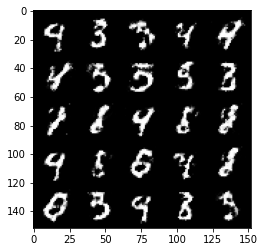

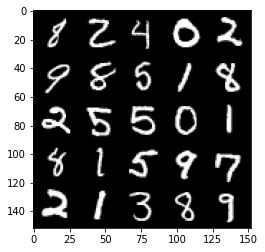

Epoch 143, step 67500: Generator loss: 1.650624709844589, discriminator loss: 0.39260090368986156


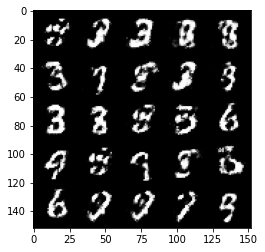

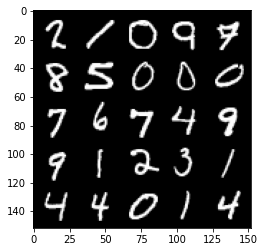

Epoch 144, step 68000: Generator loss: 1.6117406315803513, discriminator loss: 0.3995685511827467


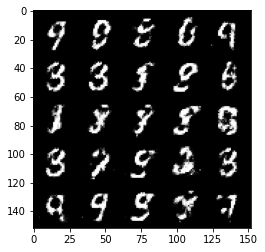

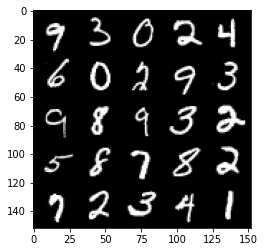

Epoch 146, step 68500: Generator loss: 1.6795249154567724, discriminator loss: 0.37740514498949096


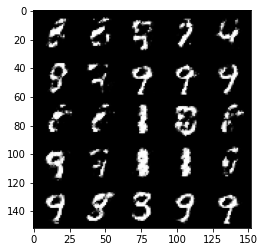

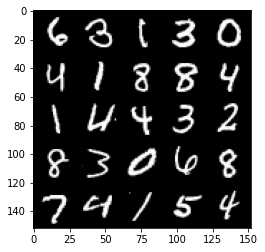

Epoch 147, step 69000: Generator loss: 1.5838681406974806, discriminator loss: 0.39149004495143874


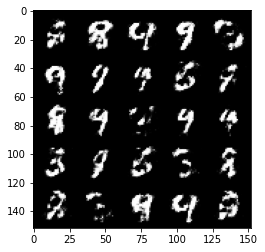

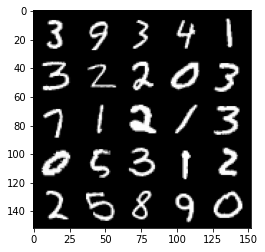

Epoch 148, step 69500: Generator loss: 1.6471055128574372, discriminator loss: 0.3731932714283465


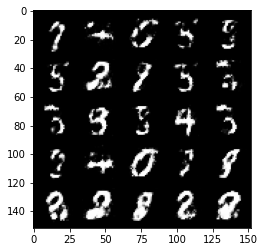

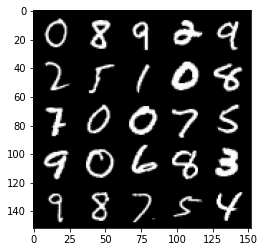

Epoch 149, step 70000: Generator loss: 1.575256856203079, discriminator loss: 0.4198472688794138


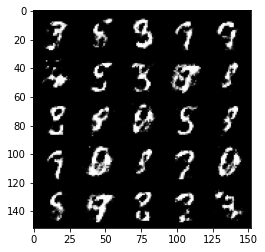

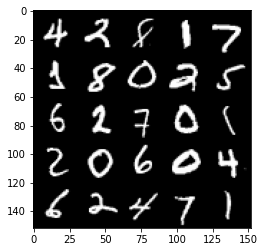

Epoch 150, step 70500: Generator loss: 1.5783337399959556, discriminator loss: 0.41435464894771584


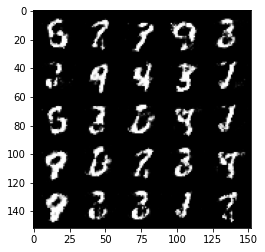

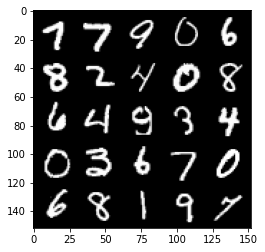

Epoch 151, step 71000: Generator loss: 1.685120747089385, discriminator loss: 0.39045300048589726


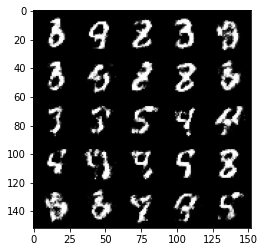

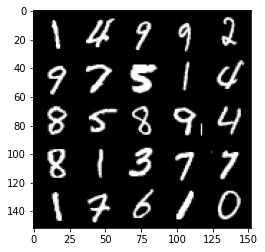

Epoch 152, step 71500: Generator loss: 1.6355108010768893, discriminator loss: 0.3861228618621824


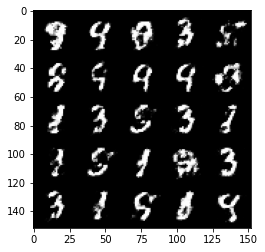

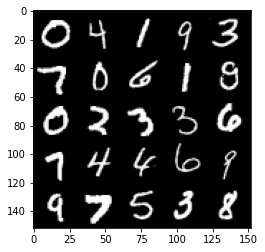

Epoch 153, step 72000: Generator loss: 1.5758288476467128, discriminator loss: 0.4077156586050986


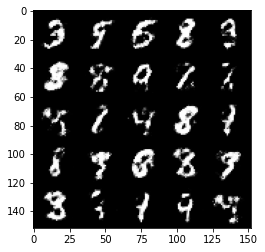

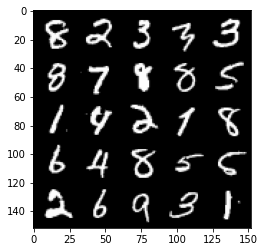

Epoch 154, step 72500: Generator loss: 1.523931380033494, discriminator loss: 0.4324801890850069


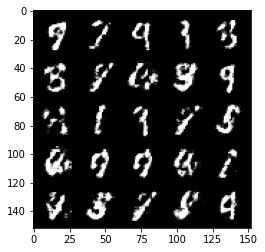

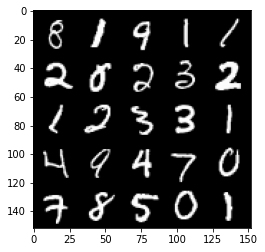

Epoch 155, step 73000: Generator loss: 1.5644248232841482, discriminator loss: 0.4118958043456081


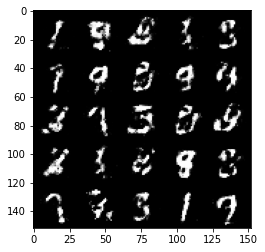

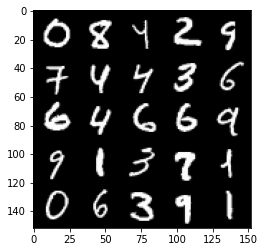

Epoch 156, step 73500: Generator loss: 1.433835003137587, discriminator loss: 0.45901235800981477


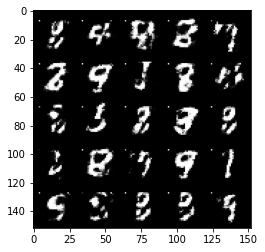

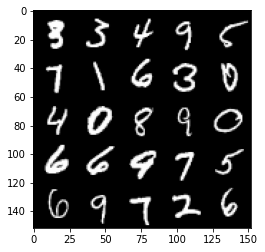

Epoch 157, step 74000: Generator loss: 1.7971431846618677, discriminator loss: 0.35810259288549445


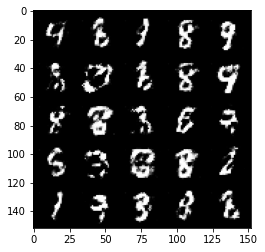

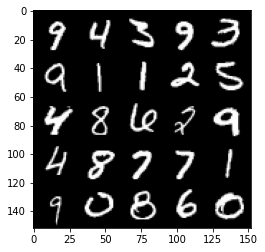

Epoch 158, step 74500: Generator loss: 1.6714827001094823, discriminator loss: 0.3857471702098844


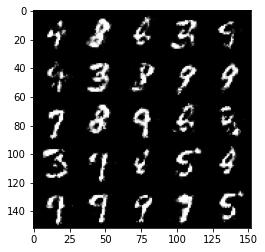

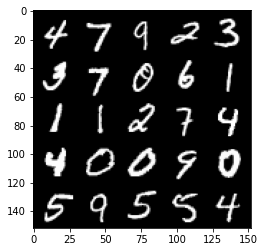

Epoch 159, step 75000: Generator loss: 1.6642971329689018, discriminator loss: 0.3751003212928773


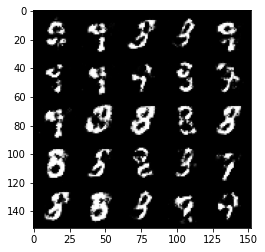

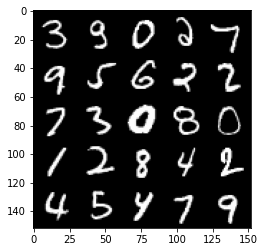

Epoch 160, step 75500: Generator loss: 1.659630854368209, discriminator loss: 0.3892586999535562


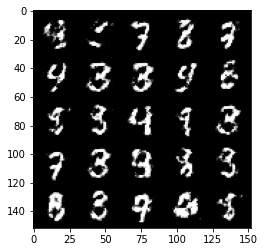

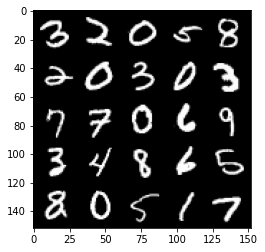

Epoch 162, step 76000: Generator loss: 1.6122998659610746, discriminator loss: 0.39533347356319415


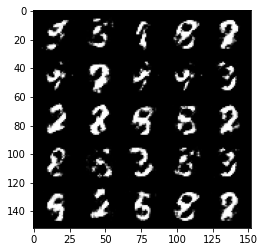

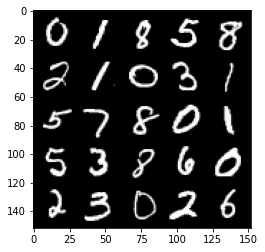

Epoch 163, step 76500: Generator loss: 1.5263759121894818, discriminator loss: 0.4236594164967535


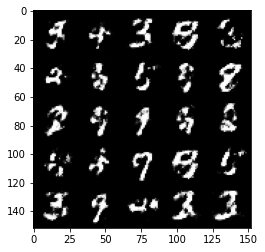

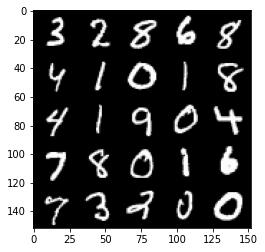

Epoch 164, step 77000: Generator loss: 1.503512424230576, discriminator loss: 0.4198059636950488


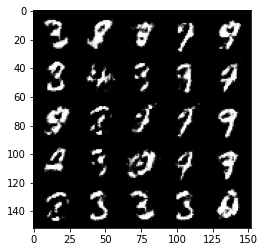

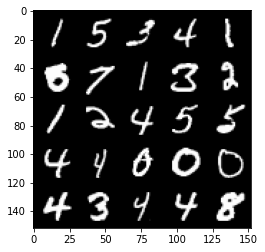

Epoch 165, step 77500: Generator loss: 1.493860818386078, discriminator loss: 0.4289886723160742


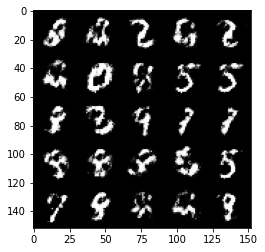

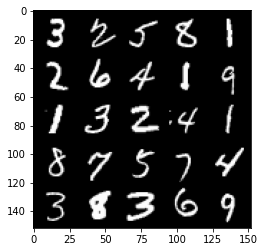

Epoch 166, step 78000: Generator loss: 1.5539868817329385, discriminator loss: 0.40946868705749495


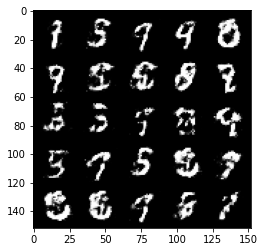

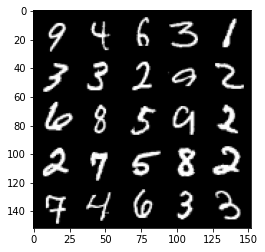

Epoch 167, step 78500: Generator loss: 1.46912153482437, discriminator loss: 0.43229289937019355


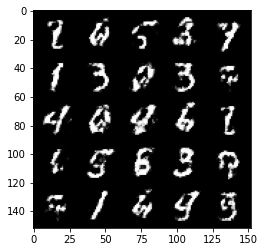

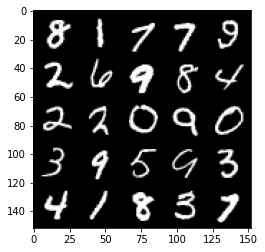

Epoch 168, step 79000: Generator loss: 1.4901798996925346, discriminator loss: 0.42961101609468466


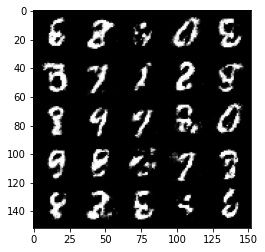

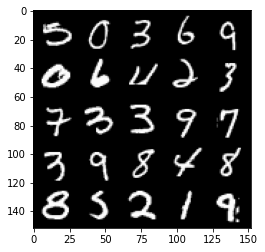

Epoch 169, step 79500: Generator loss: 1.5092483634948721, discriminator loss: 0.4275592085719103


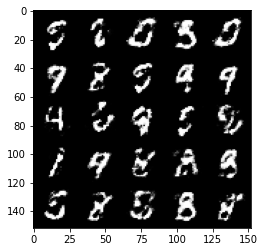

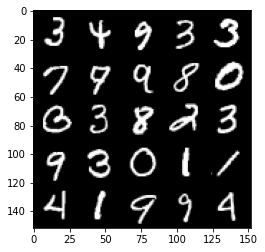

Epoch 170, step 80000: Generator loss: 1.4684553422927855, discriminator loss: 0.4305767900347712


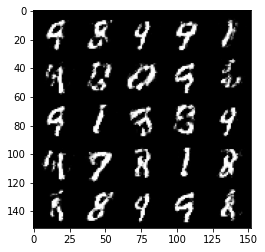

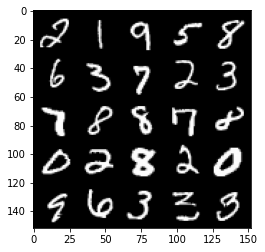

Epoch 171, step 80500: Generator loss: 1.520350001096725, discriminator loss: 0.4221917075514793


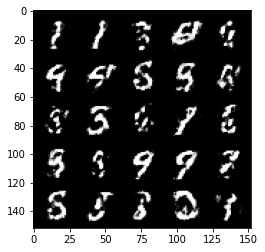

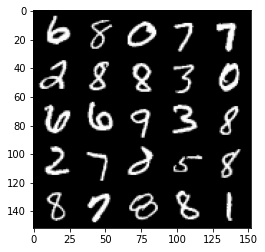

Epoch 172, step 81000: Generator loss: 1.583834307193756, discriminator loss: 0.41336326879262913


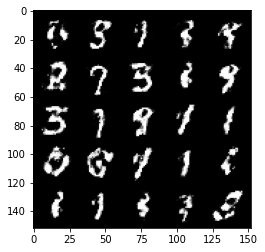

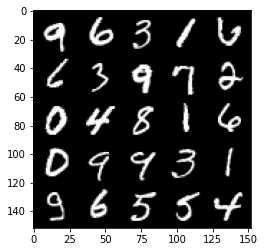

Epoch 173, step 81500: Generator loss: 1.4493431699275967, discriminator loss: 0.43778930681943834


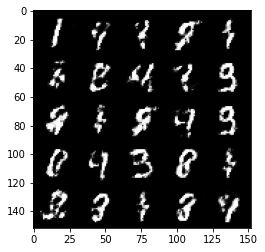

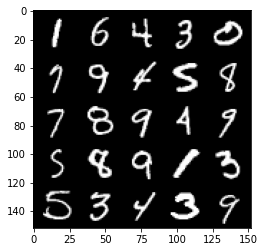

Epoch 174, step 82000: Generator loss: 1.4899293630123145, discriminator loss: 0.4287335296869272


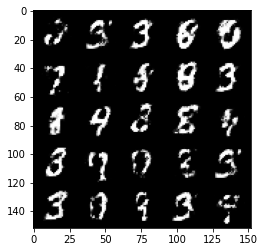

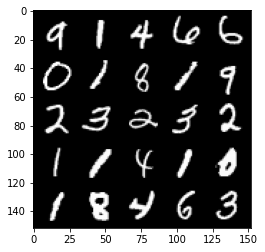

Epoch 175, step 82500: Generator loss: 1.3843846654891971, discriminator loss: 0.449410052537918


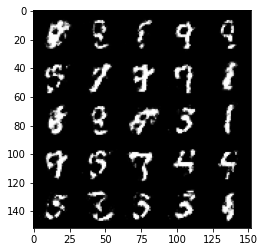

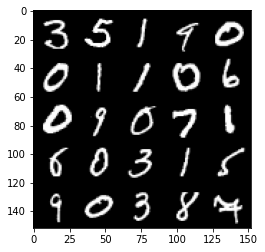

Epoch 176, step 83000: Generator loss: 1.3161209659576427, discriminator loss: 0.4784058628082272


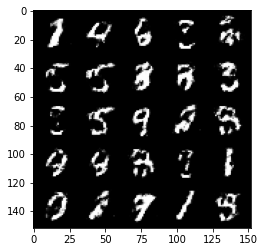

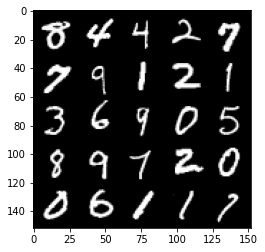

Epoch 178, step 83500: Generator loss: 1.3523711965084075, discriminator loss: 0.4582137663960457


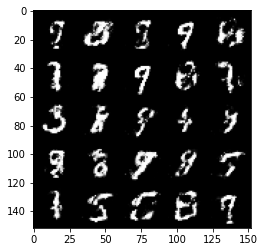

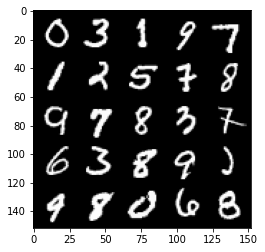

Epoch 179, step 84000: Generator loss: 1.3541023683547968, discriminator loss: 0.4685691718459129


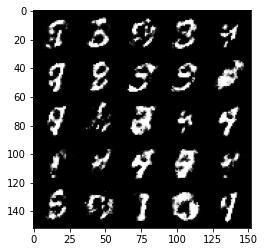

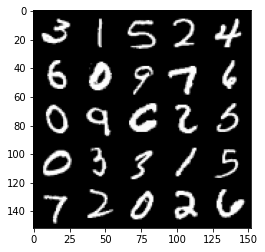

Epoch 180, step 84500: Generator loss: 1.3472435123920425, discriminator loss: 0.45543295323848715


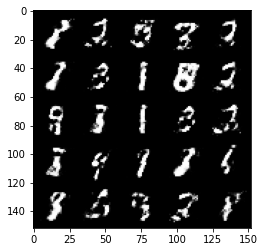

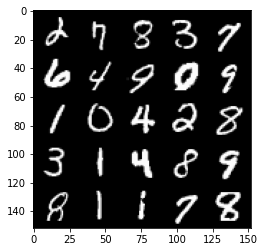

Epoch 181, step 85000: Generator loss: 1.342562265634537, discriminator loss: 0.46064901453256546


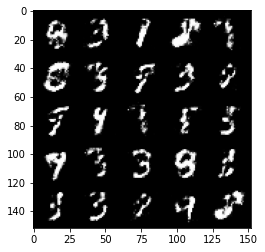

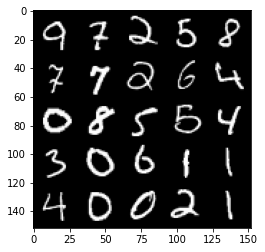

Epoch 182, step 85500: Generator loss: 1.2834795467853548, discriminator loss: 0.47974705547094354


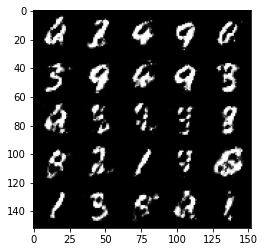

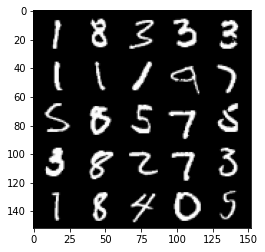

Epoch 183, step 86000: Generator loss: 1.3302656002044673, discriminator loss: 0.4784320477247234


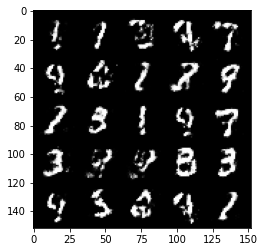

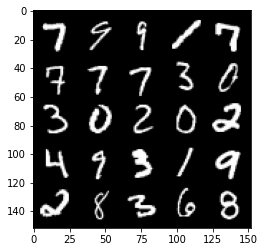

Epoch 184, step 86500: Generator loss: 1.3205308938026425, discriminator loss: 0.4859758357405664


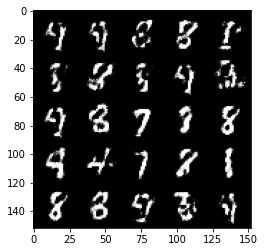

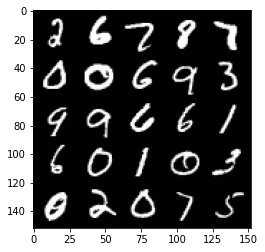

Epoch 185, step 87000: Generator loss: 1.2704742350578289, discriminator loss: 0.4955440284013747


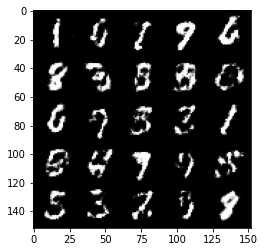

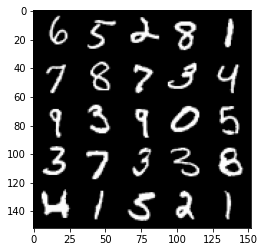

Epoch 186, step 87500: Generator loss: 1.2698280630111691, discriminator loss: 0.4824203473925591


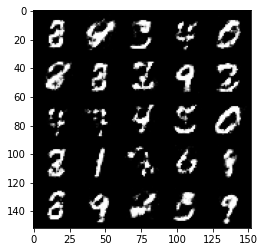

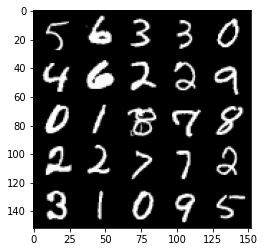

Epoch 187, step 88000: Generator loss: 1.2501311414241805, discriminator loss: 0.4944280188679696


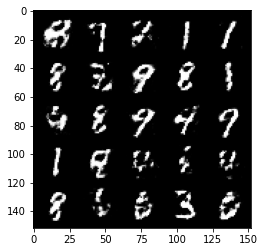

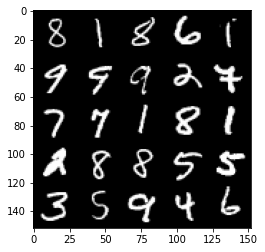

Epoch 188, step 88500: Generator loss: 1.2156994373798384, discriminator loss: 0.5071637589931487


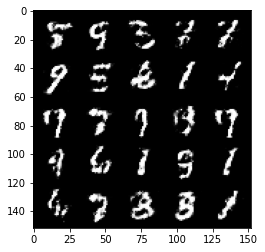

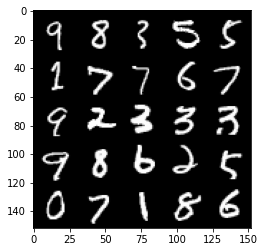

Epoch 189, step 89000: Generator loss: 1.161131841182709, discriminator loss: 0.5254572296142581


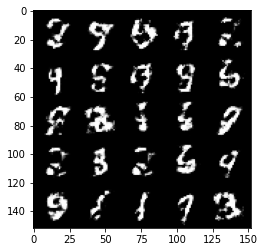

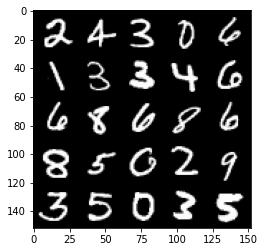

Epoch 190, step 89500: Generator loss: 1.235307714700699, discriminator loss: 0.49025181657075906


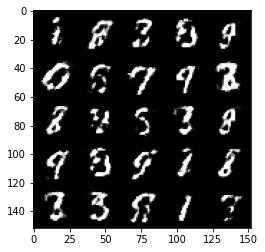

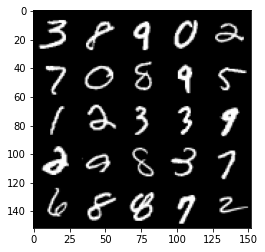

Epoch 191, step 90000: Generator loss: 1.2092188913822193, discriminator loss: 0.5079672181606296


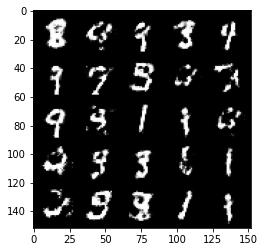

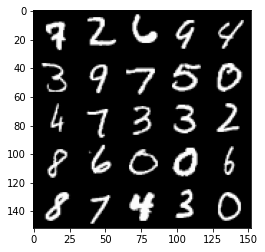

Epoch 192, step 90500: Generator loss: 1.1871468570232384, discriminator loss: 0.5119512056112292


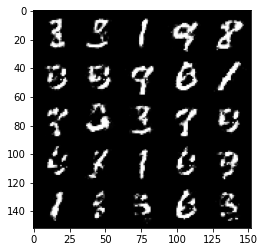

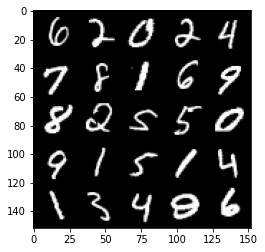

Epoch 194, step 91000: Generator loss: 1.204979082942008, discriminator loss: 0.503117530286312


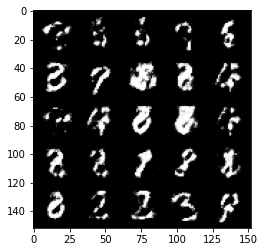

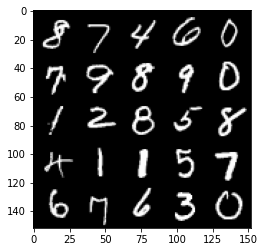

Epoch 195, step 91500: Generator loss: 1.2359097058773052, discriminator loss: 0.4922392883896833


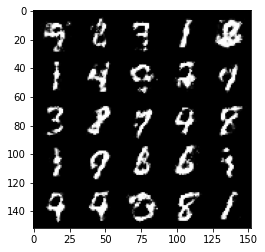

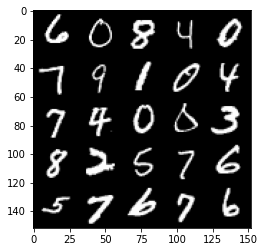

Epoch 196, step 92000: Generator loss: 1.2106783630847937, discriminator loss: 0.5046884924173355


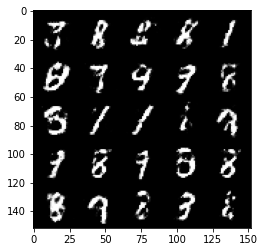

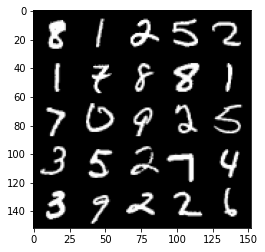

Epoch 197, step 92500: Generator loss: 1.1660394046306606, discriminator loss: 0.5228709666132928


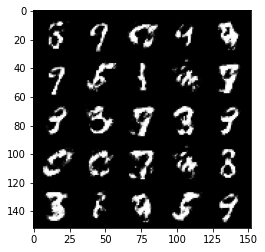

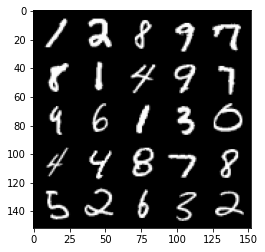

Epoch 198, step 93000: Generator loss: 1.207388649225236, discriminator loss: 0.4975943073034282


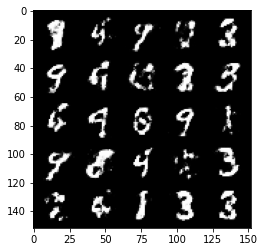

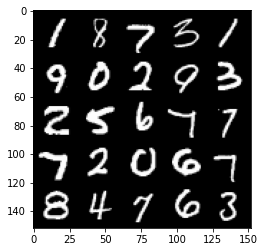

Epoch 199, step 93500: Generator loss: 1.2330660321712488, discriminator loss: 0.495001751899719


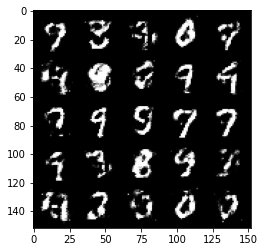

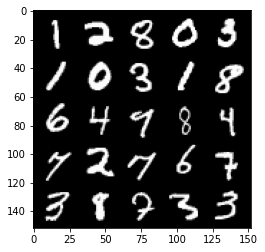

In [37]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
